In [1]:
import os
import sys

#### VP Tree

# sys.path.append(os.getcwd() + "/vp_trees_cpp/vp_trees_cpp")

# from vp_tree import FS_metric
# from vp_tree import tree_container

from utilities.load_trajectory import load_trajectory
from utilities.utilities.fubini_study import FS_metric

import time

## load trajectory data from file
import pickle

## diffusion maps
from diffusion_maps import run_diffusion_map
from diffusion_maps import run_diffusion_map_dense

## numerical
import numpy as np
from numpy import linalg as la
# from numpy.random import normal
import random
from scipy import sparse
# from scipy.sparse.linalg import eigsh
# from scipy.sparse.linalg import eigs

from sklearn.cluster import k_means
from sklearn.cluster import AgglomerativeClustering
from sklearn.neighbors import kneighbors_graph

from hmmlearn import hmm

## plotting libraries
import matplotlib.pyplot as plt
%matplotlib inline
# from mpl_toolkits.mplot3d import axes3d
# import matplotlib.cm as cm

import collections
from scipy.stats import rankdata

## Style for plots
plt.style.use("ggplot")

# 3D plotting
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

from bisect import bisect

## Supporting functions

In [2]:
def contour_plot(Mat):
    fig = plt.figure()
    ax = fig.add_subplot(111)
    cax = ax.matshow(abs(Mat), interpolation='nearest')
    fig.colorbar(cax)
    plt.show()

In [3]:
def make_markov_model(labels,n_clusters):
    T = np.zeros((n_clusters,n_clusters))
    for i in range(len(labels)-1):
        j = i + 1
        T[labels[i],labels[j]] += 1
    row_norm = np.squeeze(np.asarray(T.sum(axis = 1)))
    row_norm = np.power(row_norm,-1)
    row_norm = np.nan_to_num(row_norm)
    return (T.T*row_norm).T

In [4]:
## Count sparse elements greater than small eps.
def count_greater_than_eps(M,eps = 0.):
    count = 0
    for el in np.nditer(M):
        if abs(el) > eps:
            count += 1
    return count

In [5]:
def next_state(state,T_cum):
    r = np.random.uniform()
    return bisect(np.asarray(T_cum)[state], r)

def run_markov_chain(start_cluster, T, steps = 1000):
    '''
    Run Markov chain for a single trajectory.
    '''

    T_cum = np.matrix(np.zeros_like(T))

    for i in range(T.shape[1]):
        s = 0
        for j in range(T.shape[0]):
            s += T[i,j]
            T_cum[i,j] = s
    
    current = start_cluster
    outs = []
    for i in range(steps):
        outs.append(current)
        current = next_state(current,T_cum)
    return np.asarray(outs)

In [6]:
def time_series_ave(series,time_series_ave_over = 30,indices_len = None):
    '''
    This function returns the time series where values have been averged over 
    time_series_ave_over timesteps. The resulting average is repeated 
    time_series_ave_over times so the time axis matches the origin series.
    '''
    
    if indices_len is None:
        indices_len = len(series)
    return np.concatenate([ 
            [np.average(series[time_series_ave_over*i:time_series_ave_over*(i+1)])]
                *time_series_ave_over 
                    for i in range((indices_len)/time_series_ave_over)])

In [7]:
def get_clusters(labels,n_clusters = 30):
    clusters = [[] for _ in range(n_clusters)]
    for point,cluster in enumerate(labels):
        clusters[cluster].append(point)
    return clusters

In [8]:
def cluster_stats(labels,expects_index = 0, n_clusters = 30):
    expects_sampled = [traj_expects[expects_index][i] for i in sample_indices]
    clusters = get_clusters(labels,n_clusters)
    
    cluster_averages = []
    cluster_std_devs = []
    for cluster in clusters:
        expect_in_cluster = [expects_sampled[i] for i in cluster]
        cluster_averages.append(np.average(expect_in_cluster))
        cluster_std_devs.append(np.std(expect_in_cluster))

    cluster_values =  [ (  [ave]*len(c), 
                            map(lambda z: expects_sampled[z] ,c),
                            [std]*len(c))
                                   for c,ave,std in 
                                       zip(clusters,cluster_averages,cluster_std_devs)
                          ]

    cluster_values = sorted(cluster_values,key= lambda z:z[0][0])
    cluster_sorted = np.concatenate([v[0] for v in cluster_values])
    inside_cluster_sorted = np.concatenate([v[1] for v in cluster_values])
    cluster_std_devs_sorted = np.concatenate([v[2] for v in cluster_values])
    
    return clusters,expects_sampled,cluster_sorted,inside_cluster_sorted,cluster_std_devs_sorted

In [9]:
def summarizing_plots(n_clusters,labels,clusters,specific_points = False, bins = 100):
    plt.hist([len(c) for c in clusters], bins = bins);

    ## Transition matrix
    T = make_markov_model(labels,n_clusters)
    contour_plot(T);

    for i in range(3):
        clusters,expects_sampled,cluster_sorted,inside_cluster_sorted,cluster_std_devs_sorted = cluster_stats(labels,expects_index = i, n_clusters = n_clusters)
        plt.errorbar(range(len(cluster_sorted)),cluster_sorted, yerr=cluster_std_devs_sorted);
        l1 = plt.plot(sorted(expects_sampled));
        plt.setp(l1, linewidth=3);
        plt.show()
        
        if specific_points:
            plt.plot(inside_cluster_sorted);
            l1 = plt.plot(sorted(expects_sampled));
            plt.setp(l1, linewidth=3);
            plt.show()

In [10]:
def get_point_in_which_cluster(clusters):
    '''
    Dictionary mapping each point to its cluster
    '''
    point_in_which_cluster = {}
    for clust_index,cluster in enumerate(clusters):
        for point in cluster:
            point_in_which_cluster[point] = clust_index
    return point_in_which_cluster

In [11]:
def get_obs_sample_points(sample_indices):
    '''
    Observed quantities at sampled points
    '''
    obs_sample_points = {}
    for l in obs_indices:
        obs_sample_points[l] = np.asarray([ traj_expects[l][j] for j in sample_indices])
    return obs_sample_points

In [12]:
def get_expect_in_clusters(clusters, n_clusters, obs_sample_points):
    '''
    Get the average expectation value in each cluster.
    '''
    expect_in_clusters = {}
    for l in obs_indices:
        expect_in_clusters[l] = [0. for _ in range(n_clusters)]
        for clust_index,cluster in enumerate(clusters):
            for point in cluster:
                expect_in_clusters[l][clust_index] += obs_sample_points[l][point]
            expect_in_clusters[l][clust_index] /= float(len(cluster))
    return expect_in_clusters

In [13]:
def get_reduced_model_time_series(expect_in_clusters,indices,point_in_which_cluster):
    '''
    Return the average expectation value over clusters
    as a time series of the true trajectory
    '''
    return [[expect_in_clusters[l][point_in_which_cluster[point]] 
                for point in range(len(indices))] for l in obs_indices]

In [14]:
def plot_original_versus_reduced_timeseries(obs_sample_points, reduced_model_time_series):
    for l in obs_indices:
        f, axarr = plt.subplots(3, 2,figsize=(30,20))
        axarr[0, 0].plot(reduced_model_time_series[l])
        axarr[0, 0].set_title("Reduced model, observable #" + str(l))    
        axarr[1, 0].plot(time_series_ave(reduced_model_time_series[l],10))
        axarr[1, 0].set_title("Reduced model, observable #" + str(l)+ ", averaged over 10 timesteps")
        axarr[2, 0].plot(time_series_ave(reduced_model_time_series[l],30))
        axarr[2, 0].set_title("Reduced model, observable #" + str(l)+ ", averaged over 30 timesteps")
        axarr[0, 1].plot(obs_sample_points[l])
        axarr[0, 1].set_title("Original model, observable #" + str(l))
        axarr[1, 1].plot(time_series_ave(obs_sample_points[l],10))
        axarr[1, 1].set_title("Original model, observable #" + str(l)+ ", averaged over 10 timesteps")
        axarr[2, 1].plot(time_series_ave(obs_sample_points[l],30))
        axarr[2, 1].set_title("Original model, observable #" + str(l)+ ", averaged over 30 timesteps")
        plt.show()

In [15]:
def get_obs_generated(T_matrix, ## Transition matrix used
                      expect_in_clusters,
                      start_cluster = 0, ## index of starting cluster
                      steps = 10000,
                      n_clusters = 10,
                     ):

    steps = run_markov_chain(start_cluster,T_matrix, steps = steps)
    obs_generated = [[expect_in_clusters[l][cluster] for cluster in steps ] for l in obs_indices]
    return obs_generated

In [16]:
def plot_original_versus_generated_timeseries(obs_generated,obs_sample_points):
    f, axarr = plt.subplots(3, 2,figsize=(30,20))
    for l in obs_indices:
        axarr[l, 0].plot(time_series_ave(obs_generated[l],5))  
        axarr[l, 1].plot(time_series_ave(obs_sample_points[l],5))
    plt.show()

In [17]:
def get_hmm_hidden_states(X,n_clusters = 30, return_model = False,n_iter=100, covariance_type = 'full'):
    hmm_model = hmm.GaussianHMM(n_components=n_clusters, covariance_type=covariance_type, n_iter = n_iter)
    hmm_model.fit(X)
    print "converged", hmm_model.monitor_.converged
    hidden_states = hmm_model.predict(X)
    if not return_model:
        return hidden_states
    else:
        return hidden_states, hmm_model

##  Functions for testing transition times

In [18]:
def count_transitions(timeseries, high, low):
    current_state = 0
    num_trans = 0
    for val in timeseries:
        if current_state == 0 and val > high:
            current_state = 1
            num_trans += 1
        if current_state == 1 and val < low:
            current_state = 0
            num_trans += 1
    return num_trans

In [19]:
def trans_2_clusters(Y):
    hmm_photon_number = hmm.GaussianHMM(n_components=2, covariance_type='full', n_iter = 100)
    hmm_photon_number.fit(Y)
    print "converged", hmm_photon_number.monitor_.converged
    hidden_photon_number_cluster = hmm_photon_number.predict(Y)
    return hidden_photon_number_cluster

In [20]:
def count_label_trans(series):
    current = series[0]
    count = 0
    for n in series[1:]:
        if current != n:
            current = n
            count += 1
    return count

In [21]:
def cluster_observable_series(obs_series, moving_ave = 50, method = 'k_means', plot = True):
    averaged_reduced_timeseries = time_series_ave(obs_series,moving_ave)
    Y = np.asarray([[i] for i in averaged_reduced_timeseries])
    
    if method == 'k_means':
        k_means_trans = k_means(Y,n_clusters = 2)[1]
        if plot:
            plt.title("clustered with k means")
            plt.plot(k_means_trans)
            plt.plot(Y)
        return count_label_trans(k_means_trans)
    elif method == 'hmm':
        hidden_photon_number_cluster = trans_2_clusters(Y)
        if plot:
            plt.plot(hidden_photon_number_cluster)
            plt.plot(Y)
            plt.title("clustered with hmm")
            plt.show()
        return count_label_trans(hidden_photon_number_cluster)
    else:
        raise ValueError('unknown method')

In [22]:
def transition_stats(timeseries,num_chunck = 20,moving_ave =10):
    obs_chuncks = np.array_split(timeseries,num_chunck)
    obs_sample_trans = [cluster_observable_series(chunk,moving_ave=moving_ave,plot = False)
                            for chunk in obs_chuncks]

    print "num transitions in each chunck",obs_sample_trans
    print "Expected steps before transition",np.average([len(chunck) for chunck in obs_chuncks]) / np.average(obs_sample_trans) 
    print "total transitions", sum(obs_sample_trans)
    print "Estimated relative error",np.std(obs_sample_trans) / (np.average(obs_sample_trans)* np.sqrt(num_chunck) )
    return obs_sample_trans

In [23]:
def train_for_hmm(X,n_clusters):
    labels = get_hmm_hidden_states(X,n_clusters,return_model=False, n_iter=1000, covariance_type = 'full')
    clusters = get_clusters(labels,n_clusters)
    T = make_markov_model(labels,n_clusters)
    return (labels,clusters,T)

In [24]:
def train_for_agg_clustering(X,n_clusters):
    labels = get_cluster_labels(X,n_clusters)
    clusters = get_clusters(labels,n_clusters)
    T = make_markov_model(labels,n_clusters)
    return (labels,clusters,T)

In [25]:
def get_cluster_labels(X,n_clusters = 30):
    knn_graph = kneighbors_graph(X, 100, include_self=False)

    model = AgglomerativeClustering(linkage='ward',
                                    connectivity=knn_graph,
                                    n_clusters=n_clusters)

    model.fit(X)
    labels = model.labels_
    return labels

## Load trajectory

In [26]:
## observables are: (a, j, jz, a*a, a.dag()*a, a*jp, jp, jx, jy)

Ntraj,duration,traj_data,traj_expects = load_trajectory("absorptive_bistable")
num_data_points = len(traj_data)

## Set up settings

In [27]:
num_sample_points = 10000
obs_indices = range(3)
color_by_percentile = True
plot_2D = True
plot_3D = False
sample_type = 'hand_picked'

num_chunck = 20
handpick_indices  = lambda: np.array_split(np.arange(num_data_points),num_chunck)[-5:][1]

## Sample Trajectory

In [28]:
if sample_type == 'uniform_time':
    downsample_rate = num_data_points / num_sample_points
    sample_indices = range(num_data_points)[::downsample_rate]
elif sample_type == 'uniform_random':
    sample_indices = random.sample(range(num_data_points),num_sample_points)
elif sample_type == 'first_n':
    sample_indices = range(num_sample_points)
elif sample_type == 'last_n':
    sample_indices = range(num_data_points - num_sample_points, num_data_points)
elif sample_type == 'hand_picked':
    sample_indices = handpick_indices()
else:
    raise ValueError("unknown sample_type")

## Run Diffusion Map

In [29]:
points = np.asarray([traj_data[i] for i in sample_indices])
distance_matrix = FS_metric(points,points)
vals,vecs = run_diffusion_map_dense(distance_matrix,eps=0.5, alpha = 0.5)

## Plot diffusion map results

/Users/gil/anaconda/lib/python2.7/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


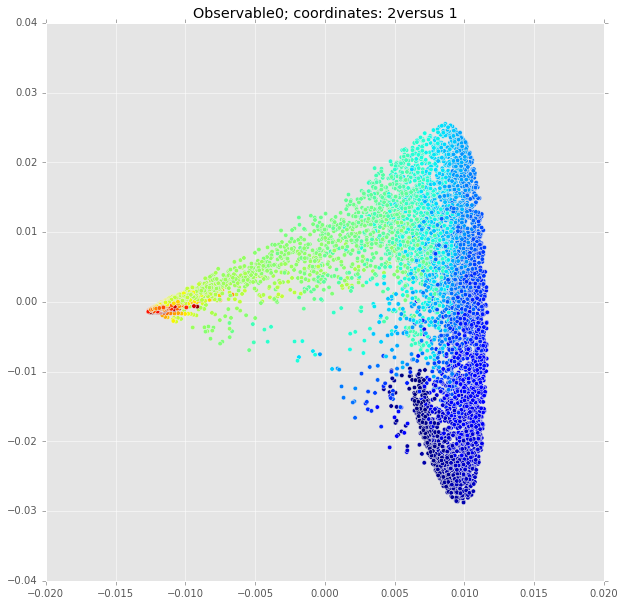

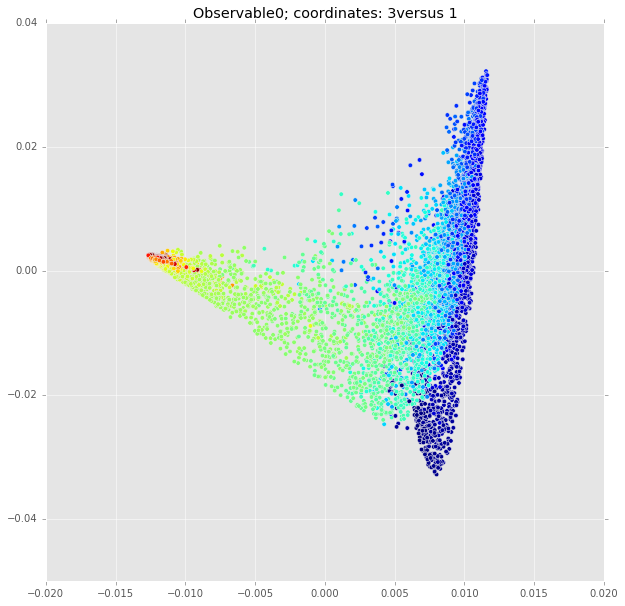

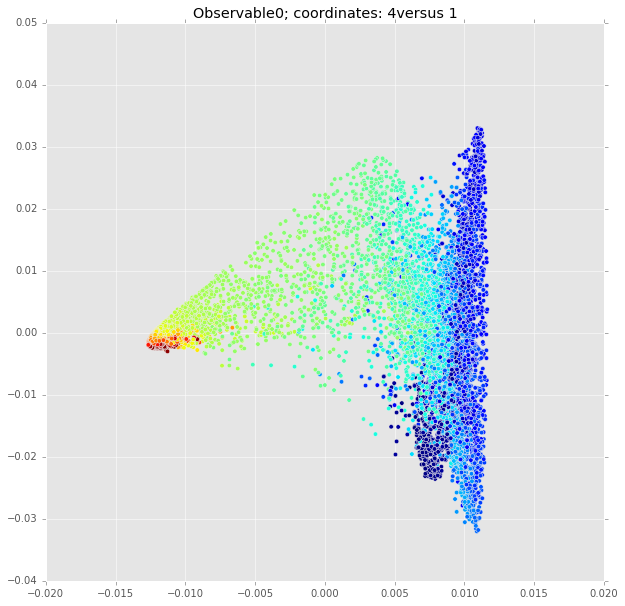

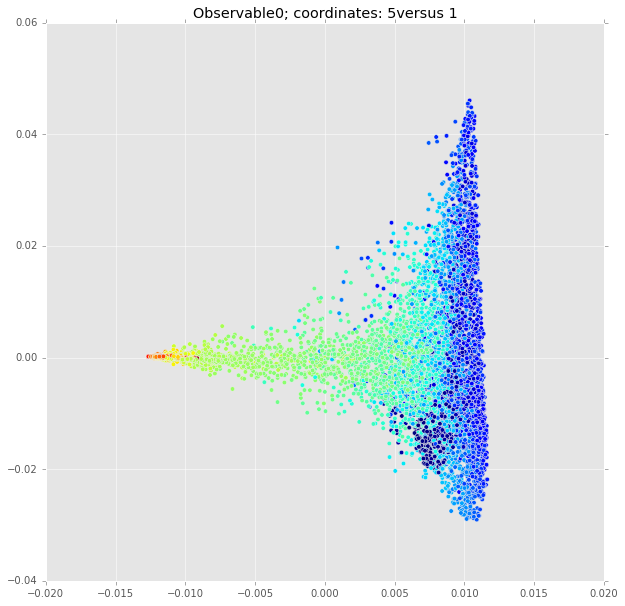

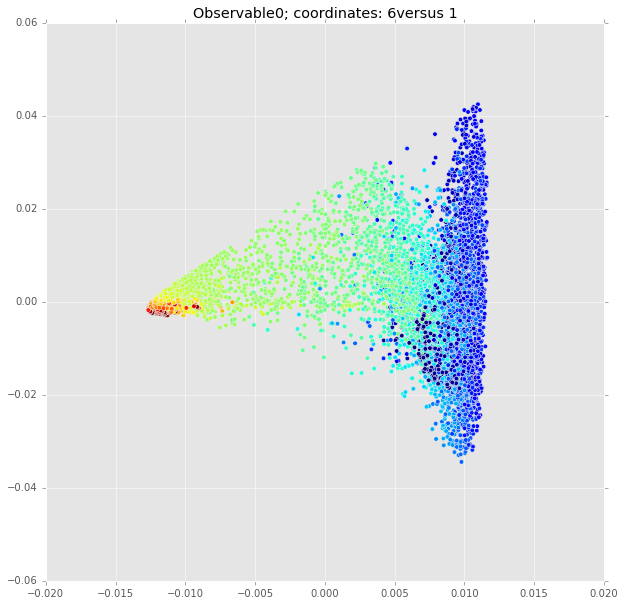

...

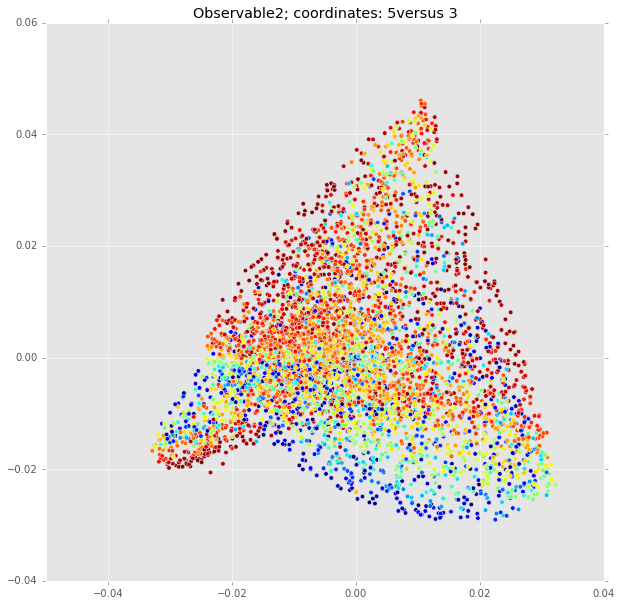

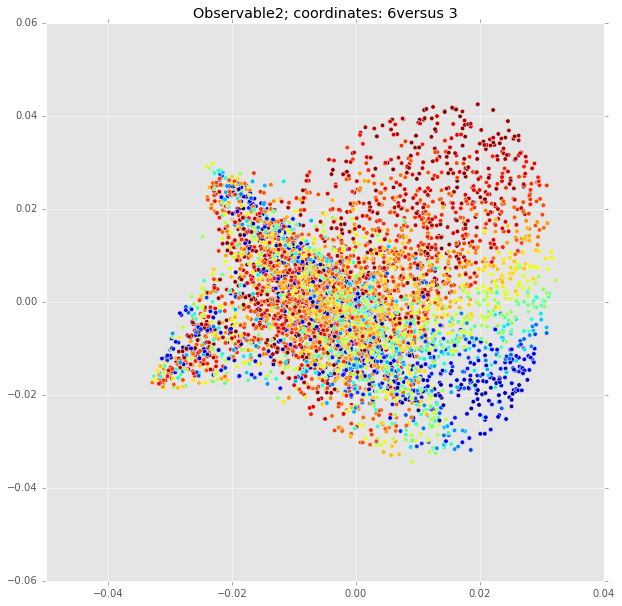

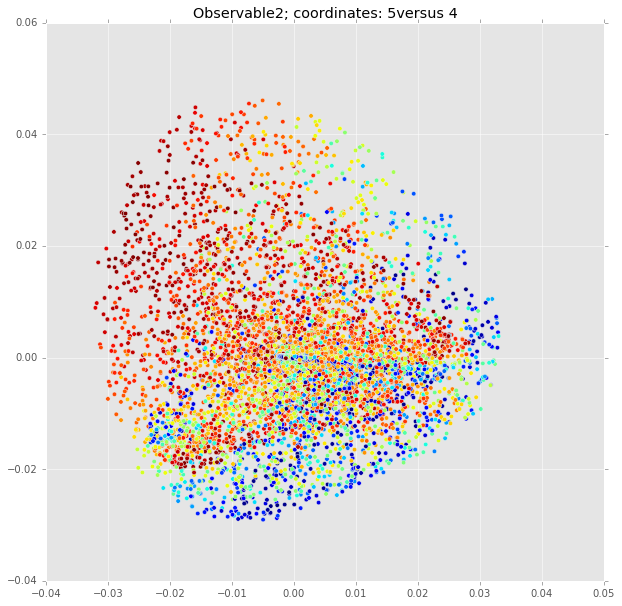

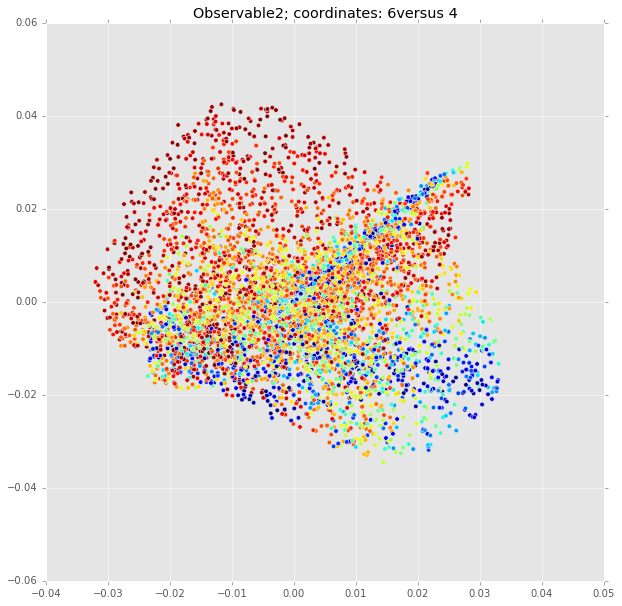

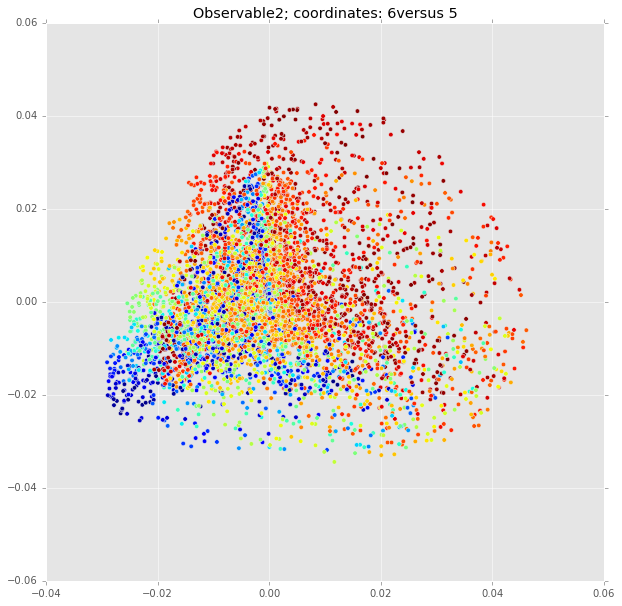

In [30]:
for l in obs_indices:
    obs_sample_points = np.asarray([ traj_expects[l][j] for j in sample_indices])
    if color_by_percentile:
        obs_sample_points = rankdata(obs_sample_points, "average") / num_sample_points
    if plot_2D:
        for k in range(1,6):
            for i in range(1+k,7):
                plt.figure(figsize= (10,10))
                plt.scatter(vecs[:,k],vecs[:,i], c = obs_sample_points)
                plt.title("Observable" + str(l) + "; coordinates: " + str(i) + "versus " + str(k) )  

    if plot_3D:
        fig = plt.figure(figsize= (14,14) )
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(vecs[:,1],vecs[:,2],vecs[:,3], c = obs_sample_points)

## Fix eigenvectors to use: Let's use the first six nontrivial eigenvectors

In [31]:
X = vecs[:,1:7]

# Next, we explore different ways of building Markov Models.

## Method 1. Let's make a Markov Model by clustering nearby states.

In [32]:
T_dict_agg = {}

In [33]:
n_clusters = 2000
labels = get_cluster_labels(X,n_clusters)
clusters = get_clusters(labels,n_clusters)

In [34]:
T_dict_agg[n_clusters] = make_markov_model(labels,n_clusters)

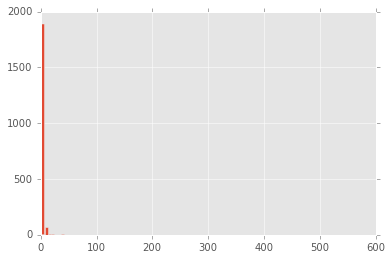

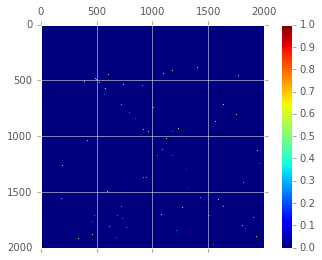

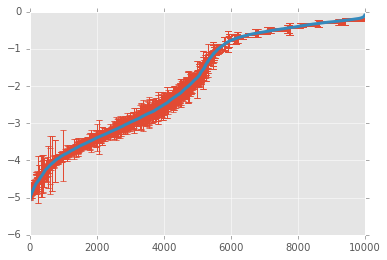

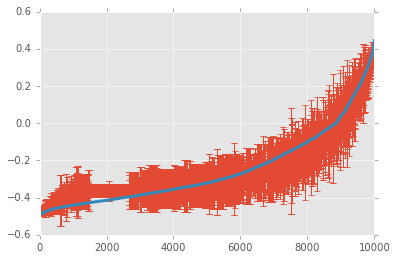

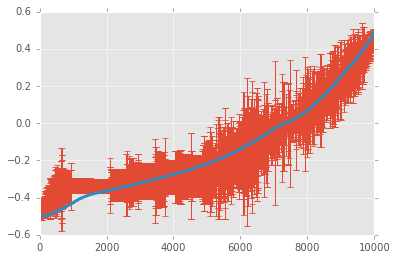

In [35]:
summarizing_plots(n_clusters,labels,clusters,bins = 100)

In [36]:
## Sparsity?

print np.count_nonzero(T_dict_agg[n_clusters])
print T_dict_agg[n_clusters].shape

4904
(2000, 2000)


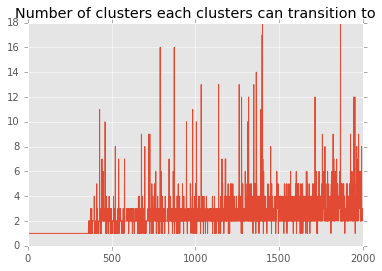

In [37]:
plt.plot([np.count_nonzero(T_dict_agg[n_clusters][i]) for i in range(n_clusters)])
plt.title("Number of clusters each clusters can transition to")

#### Comment: many states only transition to a single other state when n_clusters is large. This is a sign there is a lot of overfitting, but at the same time we will see below transition probabilities are more or less preserved.

## Testing Markov Models: How well do the clusters preserve expectation values?a

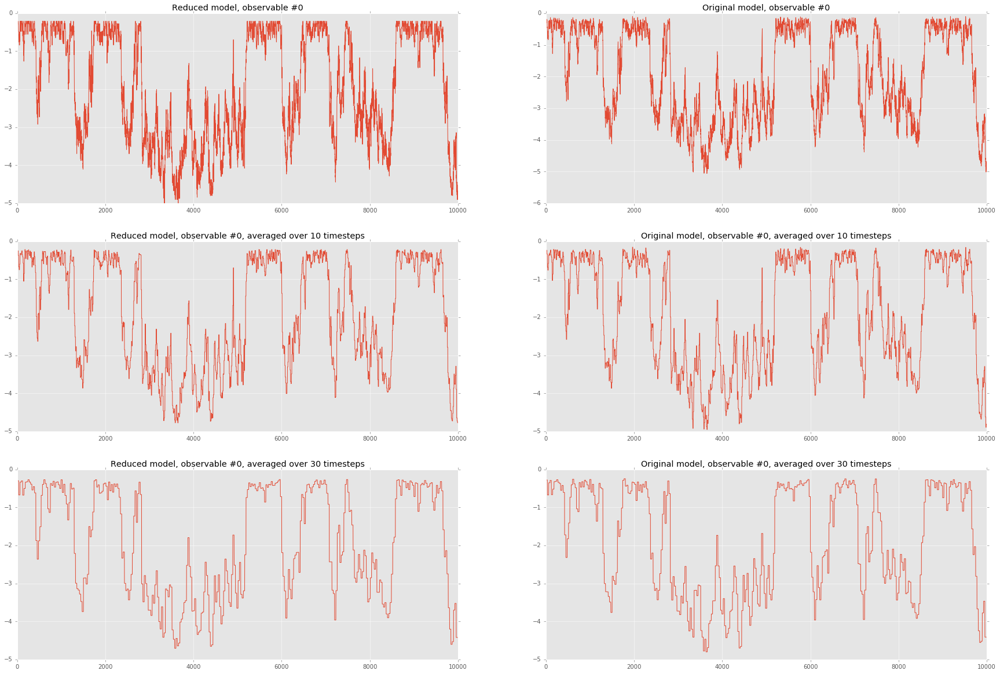

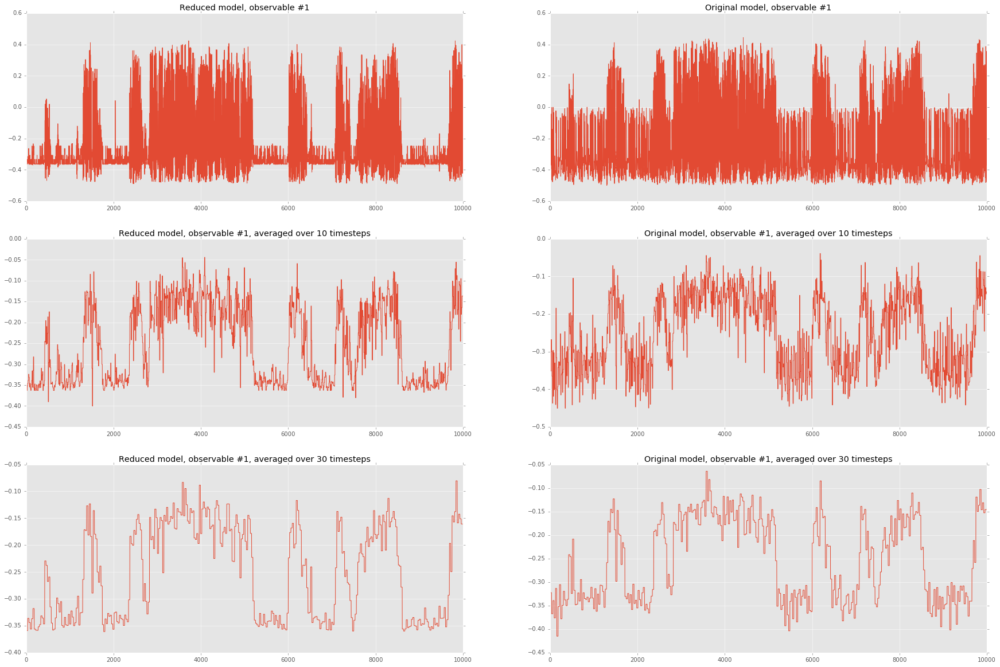

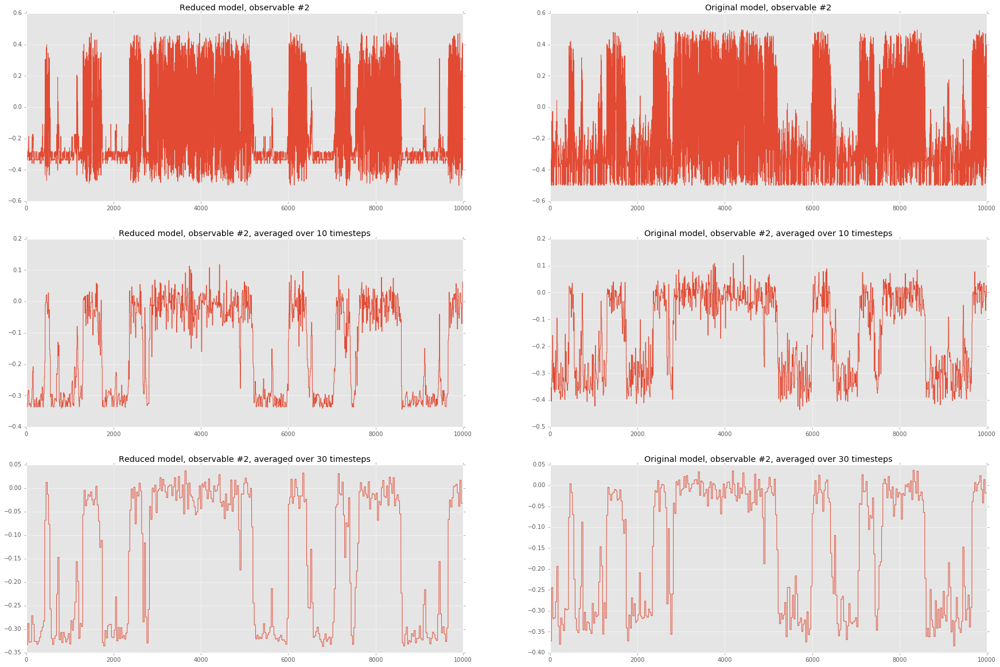

In [38]:
## Plot the original dynamics (right) versus the original dynamics inserted into 
## each cluster and given the average expectation value in that cluster (left).

point_in_which_cluster = get_point_in_which_cluster(clusters)
obs_sample_points = get_obs_sample_points(sample_indices)
expect_in_clusters = get_expect_in_clusters(clusters,n_clusters, obs_sample_points)
reduced_model_time_series = get_reduced_model_time_series(expect_in_clusters,sample_indices,point_in_which_cluster)
plot_original_versus_reduced_timeseries(obs_sample_points, reduced_model_time_series)

## Testing Markov Models: Transition rates in reduced models

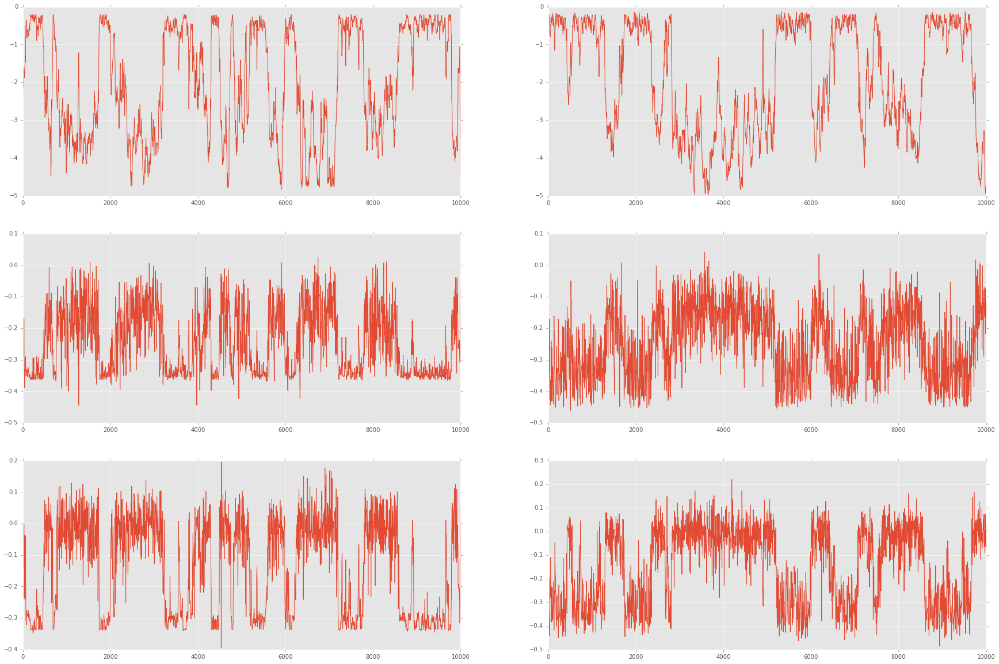

In [39]:
## Generated dynamics (left) versus original dynamics

obs_generated = get_obs_generated(T_dict_agg[n_clusters],expect_in_clusters,steps = 10000)
plot_original_versus_generated_timeseries(obs_generated,obs_sample_points)

In [40]:
def models_on_fixed_chunk(X,
                          clusters,
                          which_clusters = [30],
                          sampled_chunk = 1, 
                          sample_indices = sample_indices,
                          steps = num_data_points,
                          training_scheme = 'agg_clustering',
                         ):

    labels_d = {}
    clusters_d = {}
    T_d = {}
    timeseries = {}

    for n_clusters in which_clusters:
        if training_scheme == 'agg_clustering':
            (labels_d[sampled_chunk,n_clusters],
                 clusters_d[sampled_chunk,n_clusters],
                 T_d[sampled_chunk,n_clusters]) = train_for_agg_clustering(X,n_clusters)
        elif training_scheme == 'hmm':
            (labels_d[sampled_chunk,n_clusters],
                 clusters_d[sampled_chunk,n_clusters],
                 T_d[sampled_chunk,n_clusters]) = train_for_hmm(X,n_clusters)
        else:
            raise ValueError("unknown scheme for training.")
        labels = labels_d[sampled_chunk,n_clusters]
        clusters = clusters_d[sampled_chunk,n_clusters]
        T = T_d[sampled_chunk,n_clusters]

        point_in_which_cluster = get_point_in_which_cluster(clusters)
        obs_sample_points = get_obs_sample_points(sample_indices)
        expect_in_clusters = get_expect_in_clusters(clusters,n_clusters, obs_sample_points)
        obs_generated = get_obs_generated(T,expect_in_clusters,steps = steps) 

        timeseries[sampled_chunk,n_clusters] = obs_generated[0]
        print "completed n_clusters", n_clusters
    return labels_d,clusters_d,T_d,timeseries

In [41]:
which_clusters = [5,10,15,20,25,30,100,1000,2000]
sampled_chunk = 1
n_clusters_with_base_mod = np.array([-1,  5, 10, 15, 20, 25, 30, 40, 50, 60] )  ##locations on graph
n_clusters_with_base = np.asarray([-1] + which_clusters) ## actual locations (except base = -1)

labels_d_g, clusters_d_g, T_d_g, timeseries_g = models_on_fixed_chunk(
                                                    X,
                                                    clusters,
                                                    which_clusters = which_clusters,
                                                    sampled_chunk = sampled_chunk
                                                                        )

completed n_clusters 5
completed n_clusters 10
completed n_clusters 15
completed n_clusters 20
completed n_clusters 25
completed n_clusters 30
completed n_clusters 100
completed n_clusters 1000
completed n_clusters 2000


In [42]:
## transition stats for newly generated trajectories.
trans_stats_dict_g = {}
for n_clusters in which_clusters:
    print "stats for n_clusters" , n_clusters ,"for chunck number", 1
    trans_stats_dict_g[1,n_clusters] = transition_stats(timeseries_g[1,n_clusters]);
    
## transition stats for base trajectory
trans_stats_dict_g[1,-1] = [i for i in transition_stats(traj_expects[0][sample_indices], num_chunck = 1)]

stats for n_clusters 5 for chunck number 1
num transitions in each chunck [76, 72, 79, 90, 70, 66, 93, 74, 91, 81, 77, 87, 77, 91, 73, 78, 82, 68, 72, 72]
Expected steps before transition 127.470363289
total transitions 1569
Estimated relative error 0.02273959519
stats for n_clusters 10 for chunck number 1
num transitions in each chunck [67, 83, 70, 83, 81, 86, 76, 74, 82, 84, 76, 84, 72, 69, 79, 76, 93, 82, 73, 83]
Expected steps before transition 127.146217419
total transitions 1573
Estimated relative error 0.018254913331
stats for n_clusters 15 for chunck number 1
num transitions in each chunck [80, 84, 73, 70, 85, 81, 64, 84, 71, 96, 73, 92, 93, 75, 72, 81, 84, 80, 65, 85]
Expected steps before transition 125.945214106
total transitions 1588
Estimated relative error 0.0244767070483
stats for n_clusters 20 for chunck number 1
num transitions in each chunck [73, 77, 89, 65, 86, 74, 69, 64, 64, 71, 72, 79, 90, 63, 72, 76, 68, 68, 78, 70]
Expected steps before transition 136.240463215


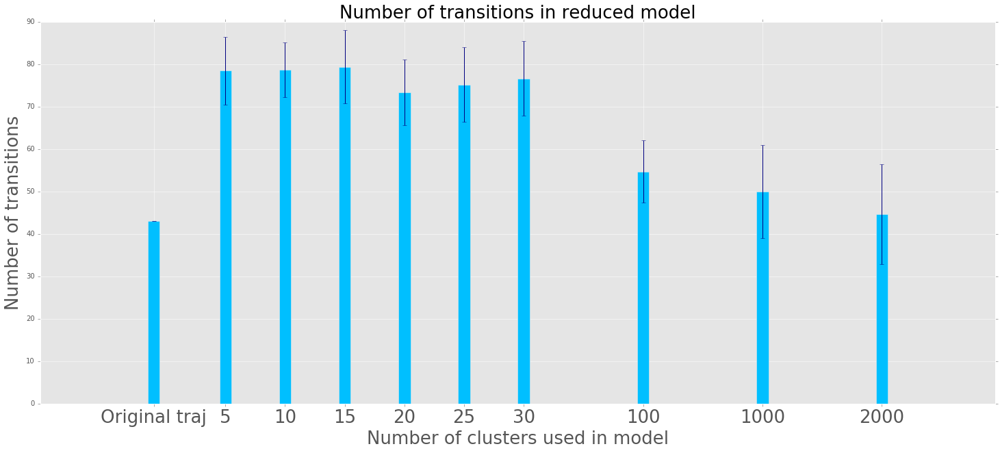

In [43]:
ys = [trans_stats_dict_g[1,i] for i in n_clusters_with_base]
ys_ave = [np.average(y) for y in ys]
ys_std = [np.std(y) for y in ys]

width = 1.       # the width of the bars
fig, ax = plt.subplots(figsize = (25,10),)

rects1 = ax.bar(n_clusters_with_base_mod, ys_ave, width, color='#00bfff', yerr=ys_std,
               error_kw=dict(ecolor='#000080') )

ax.set_xticks(n_clusters_with_base_mod + width / 2)

ax.set_xticklabels( ['Original traj'] +[str(c) for c in which_clusters ] , fontdict = { 'size' : 26})
ax.set_ylabel('Number of transitions', fontdict = { 'size' : 26})
ax.set_xlabel('Number of clusters used in model', fontdict = { 'size' : 26})
ax.set_title('Number of transitions in reduced model', fontdict = { 'size' : 26})


#     plt.bar(n_clusters_with_base,ys_ave);

plt.show()

## Observations

### Playing with the paramters, it seems the transition probabilities of the input trajecotry is approached as the number of states used for the Markov model becomes large.
### The second two observables (J, J_z) are still not perfectly captured on small timescales
### Of course, there is a lot of overfitting. We need to solve this by either (1) doing the diffusion maps step faster so we can use more data points (in principle $O(n \log n)$, or (2) use Nystrom's approximation to add new points to the data set for which the diffusion map has been found. Using the latter, we could add more points to the diffusion space, making better clusters (more points per cluster) with better transiton probabilities (more ways to transition among clusters).

In [44]:
#### How the clusters look like in diffusion space

# for k in range(1,6):
#     for i in range(1+k,7):
#         plt.figure(figsize= (10,10))
#         plt.scatter(X[:, k - 1], X[:, i - 1], c=labels, cmap=plt.cm.spectral)
#         plt.title("Coordinates: " + str(i) + "versus " + str(k) )

## Method 2. Hidden Markov Models using hmmlearn library

In [63]:
sample_n_clusters = 10

In [45]:
T_dict = {}

In [46]:
np.random.seed(42)

In [64]:
n_clusters = sample_n_clusters
labels, hmm_model = get_hmm_hidden_states(X,n_clusters,return_model=True, n_iter=1000, covariance_type = 'full')
clusters = get_clusters(labels,n_clusters)
T_dict[n_clusters] = make_markov_model(labels,n_clusters)

converged True


### NOTES:

The covariance structure that seems to work the best is 'full'. 
If n_clusters is too large, n_iter must be increased. Otherwise
it seems the covariance matrix sometimes becomes not symmetric
positive semi-deifinite and this throws an exception.
This seems to be less of a problem when using more sample points
for the diffusion map, presumably because the structure of the 
manifold is better well-defined.

The transition matrices obtained appear to already be sparse.
This is a good thing.

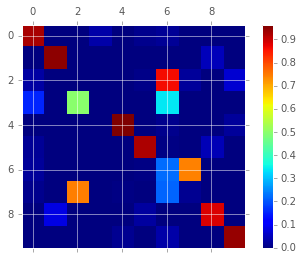

In [48]:
contour_plot(T_dict[n_clusters])

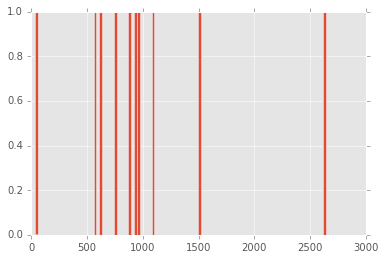

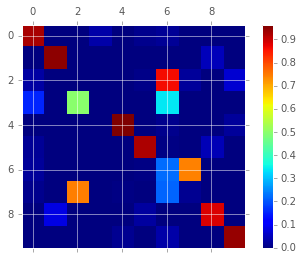

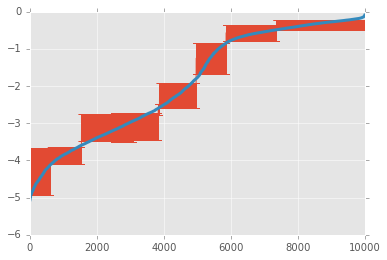

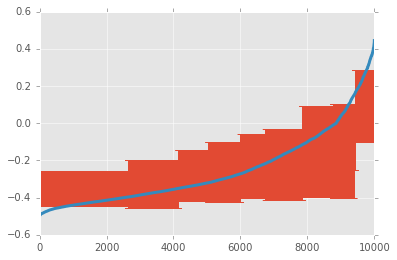

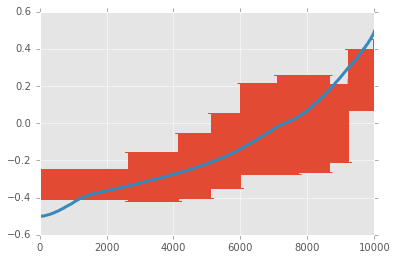

In [49]:
summarizing_plots(n_clusters,labels,clusters)
T_dict[n_clusters] = make_markov_model(labels,n_clusters)

## Analysis of Markov chains (method 2)

For the analysis below, I assume the cells above have executed for some desirable labels and n_clusters. Later we can put this into functions.

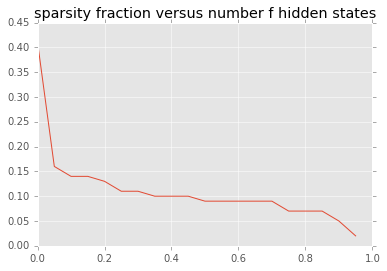

In [50]:
### More hidden states induce more sparsity.

eps_arr = np.arange(0,1,0.05)
for k in sorted(T_dict.keys()):
    plt.plot(eps_arr ,map(lambda eps: count_greater_than_eps(T_dict[k], eps) / float(k**2), eps_arr))
    plt.title("sparsity fraction versus number f hidden states")

## Testing Markov Models: How well do the clusters preserve expectation values?

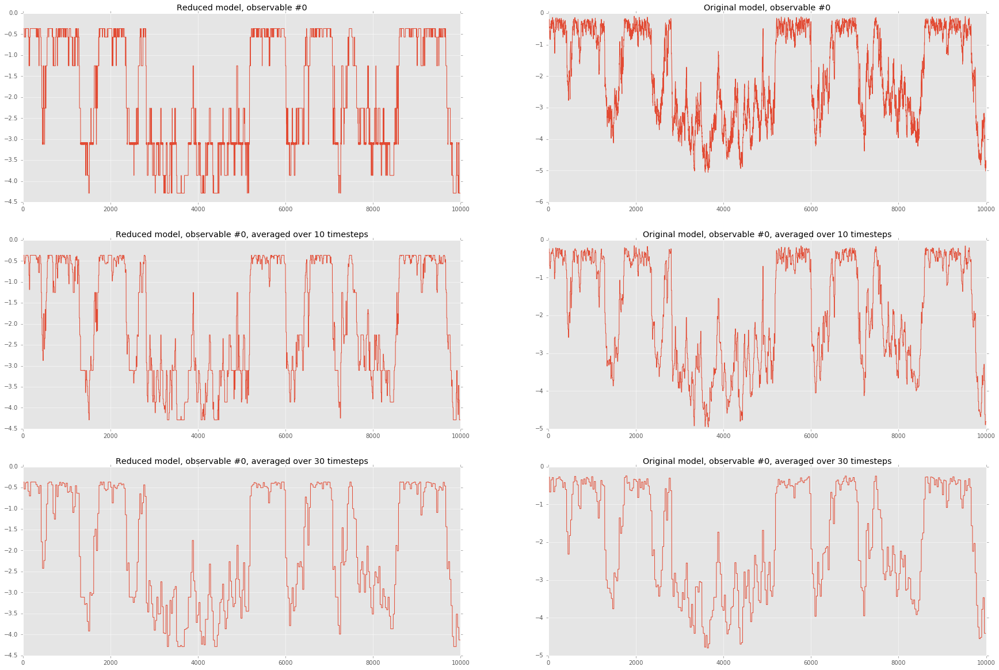

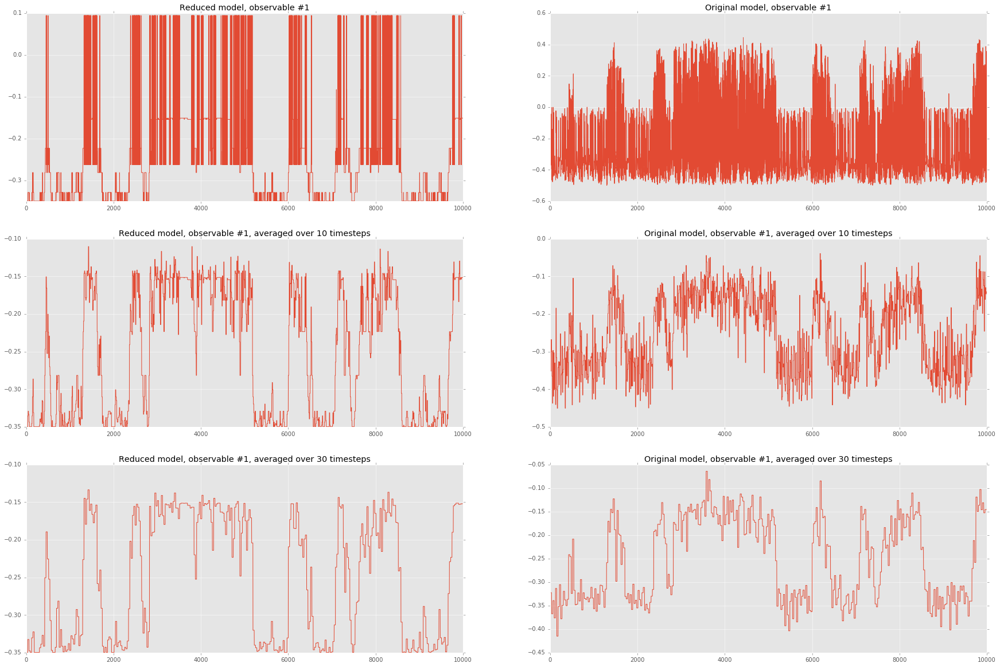

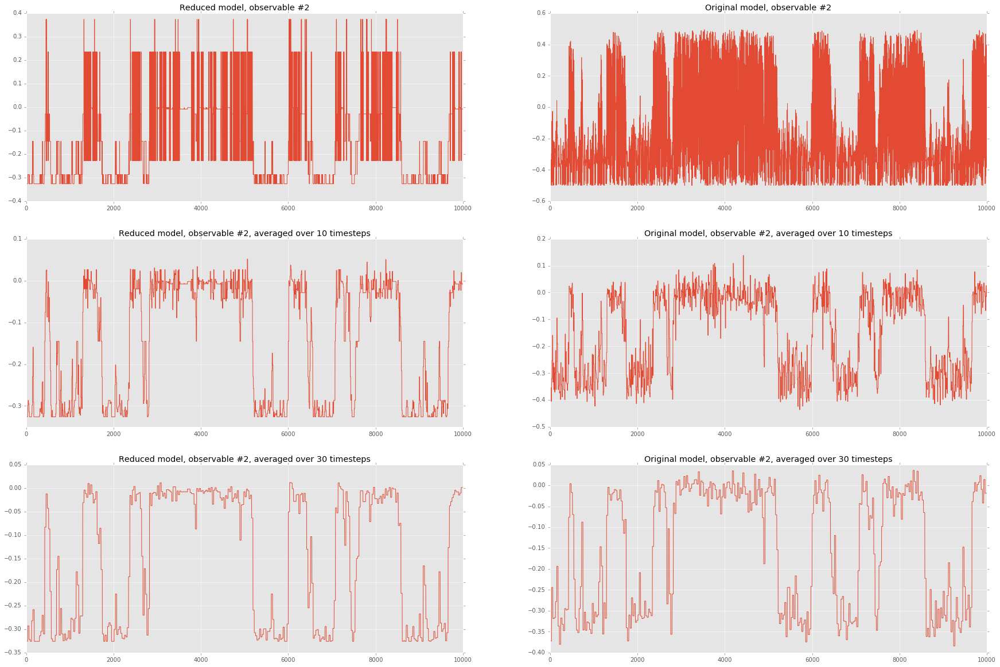

In [51]:
## Plot the original dynamics (right) versus the original dynamics inserted into 
## each cluster and given the average expectation value in that cluster (left).

point_in_which_cluster = get_point_in_which_cluster(clusters)
obs_sample_points = get_obs_sample_points(sample_indices)
expect_in_clusters = get_expect_in_clusters(clusters,n_clusters, obs_sample_points)
reduced_model_time_series = get_reduced_model_time_series(expect_in_clusters,sample_indices,point_in_which_cluster)
plot_original_versus_reduced_timeseries(obs_sample_points, reduced_model_time_series)

## Number of transitions versus time averaged timeseries

In [52]:
index = 0

In [53]:
test_moving_ave = np.arange(10,100,10)
red_trans = [cluster_observable_series(reduced_model_time_series[index],moving_ave=moving_ave, plot = False)
                for moving_ave in test_moving_ave]
obs_sample_trans = [cluster_observable_series(obs_sample_points[index],moving_ave=moving_ave,plot = False)
                        for moving_ave in test_moving_ave]

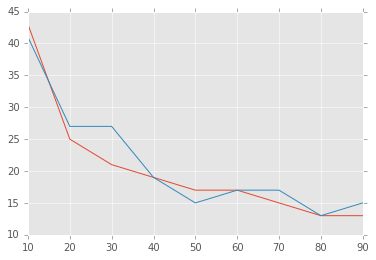

In [54]:
plt.plot(test_moving_ave,obs_sample_trans)
plt.plot(test_moving_ave,red_trans)

## Testing Markov Models: Transition rates in reduced models

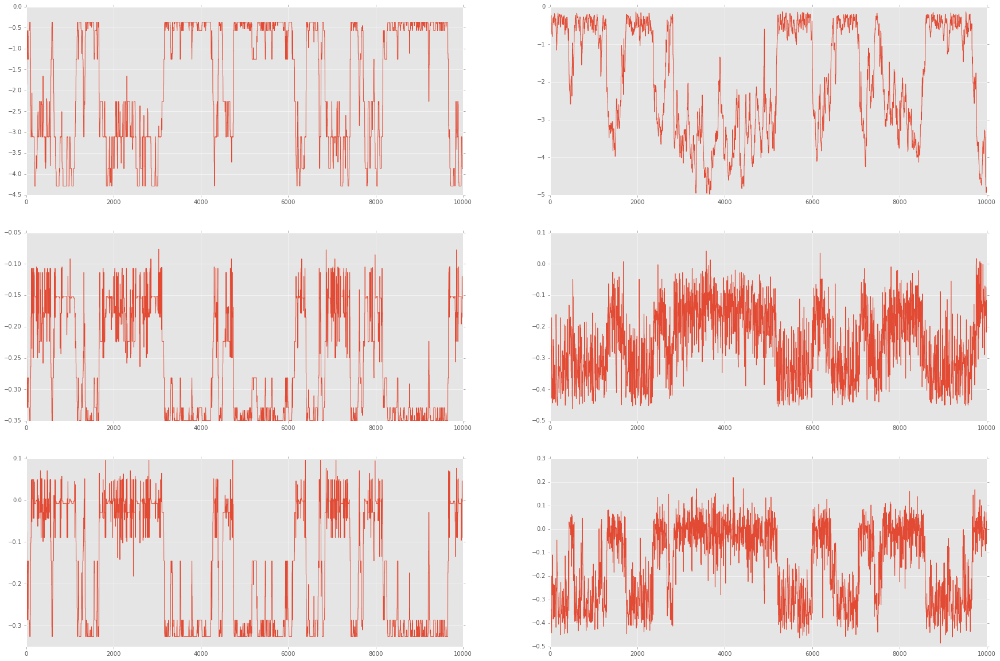

In [55]:
## Generated dynamics (left) versus original dynamics

obs_generated = get_obs_generated(T_dict[n_clusters],expect_in_clusters,steps = 10000)
plot_original_versus_generated_timeseries(obs_generated,obs_sample_points)

## Using model generated by hmmlearn

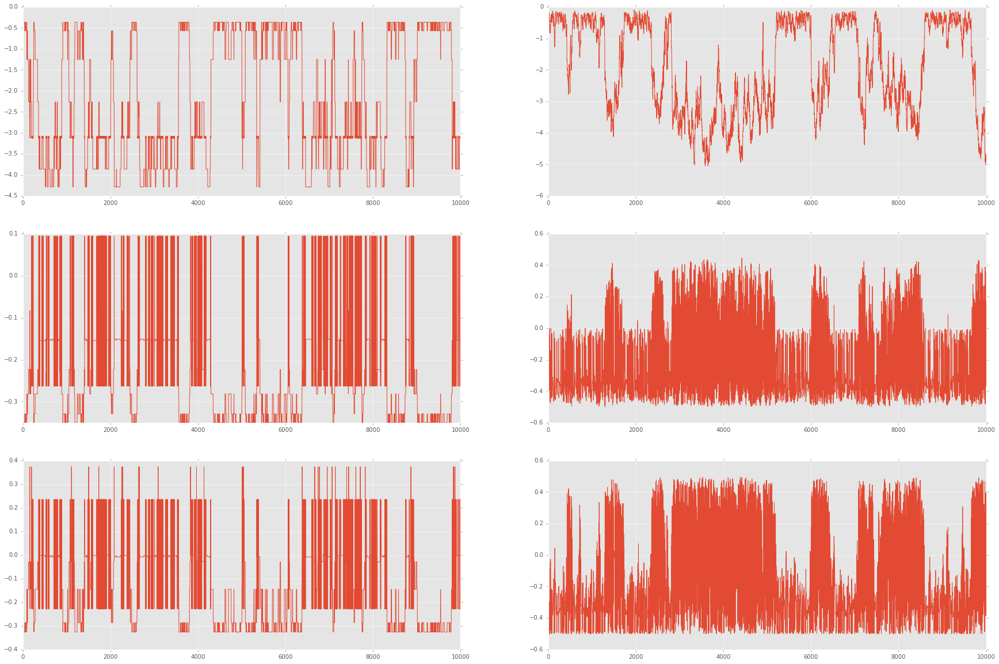

In [56]:
_ , Z = hmm_model.sample(10000)

obs_generated_hmm = [[expect_in_clusters[l][cluster] for cluster in Z ] for l in obs_indices]

f, axarr = plt.subplots(3, 2,figsize=(30,20))
for l in obs_indices:
    axarr[l, 0].plot(obs_generated_hmm[l])
    axarr[l, 1].plot(obs_sample_points[l])
plt.show()

In [57]:
transition_stats(traj_expects[0]);

num transitions in each chunck [41, 27, 51, 55, 35, 38, 43, 42, 46, 41, 67, 37, 42, 41, 45, 47, 43, 49, 47, 17]
Expected steps before transition 234.193208431
total transitions 854
Estimated relative error 0.0514982912154


##  next, we do a more thorough analysis, training different cluster sizes on different parts of the original trajectory. We want to see how well the transition times match (and how much overfitting we will find).

In [58]:
which_clusters = [5,10,15,20,25,30]
sampled_chunk = 1
n_clusters_with_base_mod = np.array([-1,  5, 10, 15, 20, 25, 30] )  ##locations on graph
n_clusters_with_base = np.asarray([-1] + which_clusters) ## actual locations (except base = -1)

labels_d, clusters_d, T_d, timeseries = models_on_fixed_chunk(
                                                    X,
                                                    clusters,
                                                    which_clusters = which_clusters,
                                                    sampled_chunk = sampled_chunk,
                                                    training_scheme = 'hmm',
                                                                        )

converged True
completed n_clusters 5
converged True
completed n_clusters 10
converged True
completed n_clusters 15
converged True
completed n_clusters 20
converged True
completed n_clusters 25
converged True
completed n_clusters 30


In [59]:
## transition stats for newly generated trajectories.
trans_stats_dict = {}
for n_clusters in which_clusters:
    print "stats for n_clusters" , n_clusters ,"for chunck number", 1
    trans_stats_dict[1,n_clusters] = transition_stats(timeseries[1,n_clusters]);
    
## transition stats for base trajectory
trans_stats_dict[1,-1] = [i for i in transition_stats(traj_expects[0][sample_indices], num_chunck = 1)]

stats for n_clusters 5 for chunck number 1
num transitions in each chunck [53, 46, 66, 73, 78, 73, 77, 52, 83, 69, 56, 55, 72, 62, 72, 70, 57, 55, 71, 62]
Expected steps before transition 153.610599078
total transitions 1302
Estimated relative error 0.0341570379342
stats for n_clusters 10 for chunck number 1
num transitions in each chunck [53, 43, 42, 47, 51, 42, 49, 46, 48, 33, 35, 51, 60, 49, 54, 57, 43, 49, 32, 43]
Expected steps before transition 215.750809061
total transitions 927
Estimated relative error 0.0350311063883
stats for n_clusters 15 for chunck number 1
num transitions in each chunck [37, 41, 43, 44, 59, 43, 43, 39, 44, 46, 45, 42, 55, 25, 54, 50, 50, 33, 49, 44]
Expected steps before transition 225.73476298
total transitions 886
Estimated relative error 0.0377420966184
stats for n_clusters 20 for chunck number 1
num transitions in each chunck [57, 25, 38, 32, 55, 26, 52, 47, 49, 37, 47, 35, 55, 33, 36, 34, 33, 51, 44, 41]
Expected steps before transition 241.839177751


In [60]:
comparing_with_method1 = True

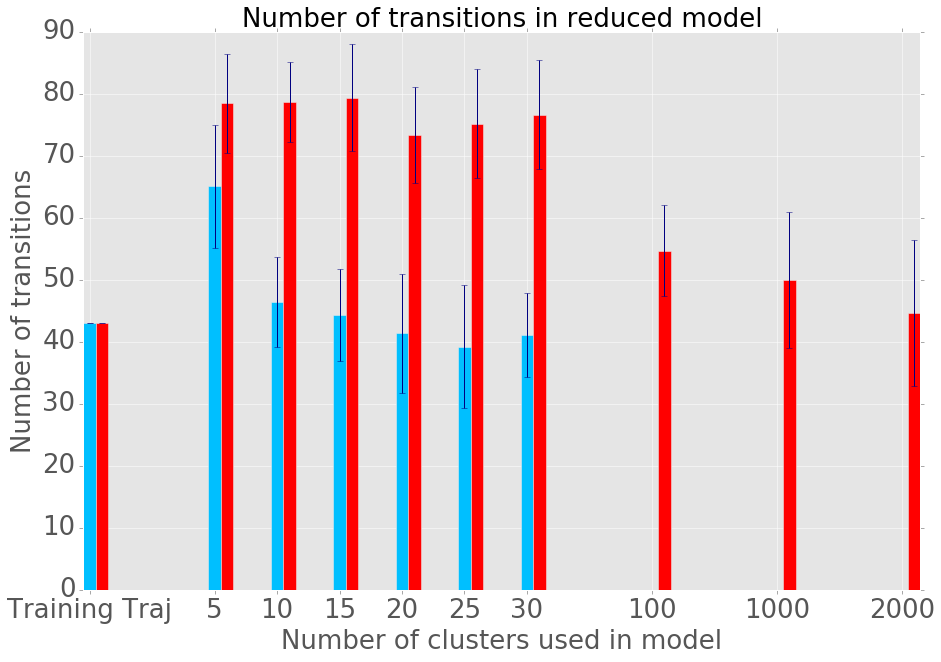

In [61]:
sampled_chunk = 1

which_clusters = [5,10,15,20,25,30]
n_clusters_with_base_mod = np.array([-5,5, 10, 15, 20, 25, 30] )  ##locations on graph
n_clusters_with_base  = np.array([-1,5,10,15,20,25,30]) ## locations in dict

n_clusters_with_base = np.asarray([-1] + which_clusters)
ys = [trans_stats_dict[sampled_chunk,i] for i in n_clusters_with_base]
ys_ave = [np.average(y) for y in ys]
ys_std = [np.std(y) for y in ys]

width = 1.       # the width of the bars

fig, ax = plt.subplots(figsize = (15,10),)

rects1 = ax.bar(n_clusters_with_base_mod, ys_ave, width, color='#00bfff', yerr=ys_std,
           error_kw=dict(ecolor='#000080') )

ax.tick_params(axis='both', which='major', labelsize=26)

ax.set_xticks(n_clusters_with_base + width / 2)
ax.set_xticklabels( ['Original traj'] +[str(c) for c in which_clusters ] , fontdict = { 'size' : 26})
ax.set_ylabel('Number of transitions', fontdict = { 'size' : 26})
ax.set_xlabel('Number of clusters used in model', fontdict = { 'size' : 26})
ax.set_title('Number of transitions in reduced model', fontdict = { 'size' : 26})

#####

if comparing_with_method1:
    which_clusters = [5,10,15,20,25,30,100,1000,2000] 
    n_clusters_with_base_mod = np.array([-5,5, 10, 15, 20, 25, 30, 40, 50, 60] ) + width  ##locations on graph.
    n_clusters_with_base  = np.array([-1,5,10,15,20,25,30,100,1000,2000]) ## locations
    ys = [trans_stats_dict_g[1,i] for i in n_clusters_with_base]
    ys_ave = [np.average(y) for y in ys]
    ys_std = [np.std(y) for y in ys]

    rects2 = ax.bar(n_clusters_with_base_mod, ys_ave, width, color='r', yerr=ys_std,
                   error_kw=dict(ecolor='#000080') )
    ax.set_xticks(n_clusters_with_base_mod + width / 2 - 1)
    ax.set_xticklabels( ['Training Traj'] + [str(c) for c in which_clusters ] , fontdict = { 'size' : 26})

plt.show()

### Observations:

Above we plot three observables for the original system, and for the clustered (reduced) system.
We include plots with all the timesteps, as well we timesteps averaged over 10 or 30 steps.

The reduced dynamics maintain the slow-time dynamics of the original system.
For observables 1 and 2 (J and J_z), some of the fast dynamics are not 
fully captured. However, when averaging the system over groups of several
timesteps (giving the slow dynamics) the reduced system and the original 
system appear similar.

## Let's see how well the T matrix generated from the transition between labeled data points compates with the hmm transition matrix

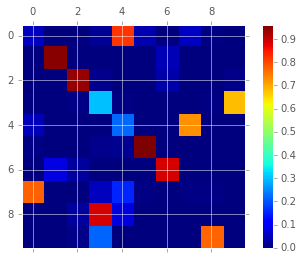

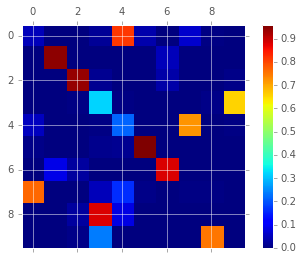

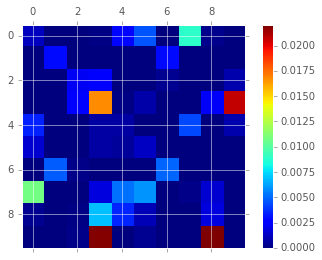

In [65]:
n_clusters = sample_n_clusters

contour_plot(T_dict[n_clusters]);
contour_plot(hmm_model.transmat_);
contour_plot(T_dict[n_clusters] - hmm_model.transmat_);

We see it varies a little, but not by much. Presumably hmmlearn does something a little differently.

# Below: work in progress

## Another experiment: Trying to learn the action of $H_{eff}$ and $L$ on the clusters

In [ ]:
Regime = "absorptive_bistable"
location = './make_quantum_jump_trajectories/trajectory_data/'

pkl_file = open(location + Regime +'.pkl', 'rb')
pkl_dict = pickle.load(pkl_file)
pkl_file.close()

L_times = pkl_dict["col_times"]
which_L = pkl_dict["col_which"]

In [ ]:
L_times

In [ ]:
L_times_i = {}

In [ ]:
for i in set(which_L):
    L_times_i[i] = filter(lambda z: z == i, L_times)

In [ ]:
L_times_i

In [ ]:
print L_times.shape
print which_L.shape
print traj_data.shape

In [ ]:
time_to_timestep = {t:s for t,s in zip(pkl_dict['times'],range(len(pkl_dict['times'])))}

In [ ]:
L_timesteps = map(lambda z: time_to_timestep[z],L_times)

In [ ]:
pkl_dict['times']

In [ ]:
L_times

In [ ]:
for t,

###     Run Markov chain for probability of being in each state.

In [ ]:
def run_markov_chain_average(init_state, T, steps = 1000):
    '''
    Run Markov chain for probability of being in each state.
    '''
    
    ## check for s
    if T.shape[0] != init_state.shape[1] or T.shape[1] != init_state.shape[1]:
        raise ValueError("wrong dimensions in T and init_state.")
    
    current = init_state
    outs = []
    for i in range(steps):
        outs.append(current)
        current = current * T
    return np.asarray(outs)

In [ ]:
init_state = sparse.csr_matrix((1,n_clusters))
init_state[0] = 1.

In [ ]:
steps = run_markov_chain_average(init_state,T_dict[n_clusters])